# Load Functions

## 0. imports

In [ ]:
from reportlab.lib.styles import ParagraphStyle, getSampleStyleSheet
from reportlab.lib.pagesizes import A4
from reportlab.lib import colors
from reportlab.platypus import SimpleDocTemplate, Paragraph, Spacer, Table, TableStyle, Image
from reportlab.lib.utils import ImageReader
import os
import mne

from utils import *
from eeg import compute_eeg_pipeline, test_eeg_pipeline
from ecg_qc import ecg_qc 
from eda_qc import eda_qc
from rsp_qc import *
from mic_qc import *
from lsl_problem import *
from et_qc import *
from webcam_qc import webcam_qc

# subject = "P5029423"
# # xdf_filename = f'/Users/bryan.gonzalez/CUNY_subs/sub-{subject}/sub-{subject}_ses-S001_task-CUNY_run-001_mobi.xdf'
# xdf_filename = f'/Users/camilla.strauss/Desktop/CUNY_Data/Data/sub-{subject}/sub-{subject}_ses-S001_task-CUNY_run-001_mobi.xdf'


In [ ]:
subject = 'P5182010'
xdf_filename = f'/Users/camilla.strauss/Desktop/CUNY_Data/Data/sub-{subject}/sub-{subject}_ses-S001_task-CUNY_run-001_mobi.xdf'
video_filename = f'/Users/camilla.strauss/Desktop/CUNY_Data/Data/sub-{subject}/sub-{subject}_task-CUNY_run-001_video.avi'

# Get Metrics

## 1. EEG

In [ ]:
#Compute the eeg vars
# eeg_vars = compute_eeg_pipeline(xdf_filename)

Creating RawArray with float64 data, n_channels=128, n_times=299990
    Range : 0 ... 299989 =      0.000 ...   300.000 secs
Ready.
Creating RawArray with float64 data, n_channels=1, n_times=299990
    Range : 0 ... 299989 =      0.000 ...   300.000 secs
Ready.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 3301 samples (3.301 s)

Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (f

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.1s finished


Removed notch frequencies (Hz):
     60.00 :  129 windows
    120.00 :  129 windows
    180.00 :  129 windows
    240.00 :  129 windows
    241.00 :  129 windows
    299.00 :  129 windows
    300.00 :  129 windows
    301.00 :  129 windows
    359.00 :  129 windows
    360.00 :  129 windows
    361.00 :  129 windows
    419.00 :  129 windows
    420.00 :  129 windows
    421.00 :  129 windows
    479.00 :  129 windows
    480.00 :  129 windows
    481.00 :  129 windows
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 3301 samples (3.301 s)

NOTE: pick_types() is a legacy function. Ne

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 129 out of 129 | elapsed:    0.0s finished


Executing RANSAC
This may take a while, so be patient...


KeyboardInterrupt: 

## 2. ECG

Effective sampling rate: 599.8625956426739
Average heart rate: 74.87769004802422
Kurtosis signal quality index: 9.64336135117787
Power spectrum distribution signal quality index: 0.5727166460609386
Relative power in baseline signal quality index: 40.29131880187713
Signal to Noise Ratio: 5.643577665674899


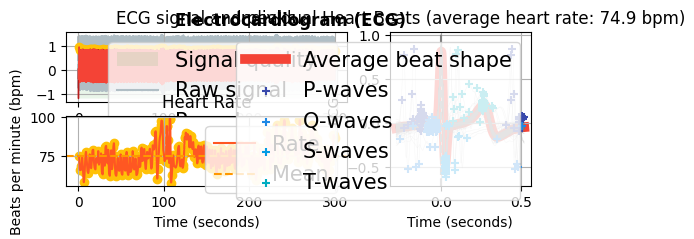

In [ ]:
[ecg_vars, ecg_plt] = ecg_qc(xdf_filename)


In [ ]:
ecg_vars.keys()

dict_keys(['sampling_rate', 'average_heart_rate', 'kurtosis_SQI', 'power_spectrum_distribution_SQI', 'relative_baseline_power_sqi', 'SNR'])

In [ ]:
ecg_print = {
    "Effective sampling rate": f'{ecg_vars["sampling_rate"]:.4f}', 
    "Signal to Noise Ratio": f'{ecg_vars["SNR"]:.4f}',
    "Average heart rate": f'{ecg_vars["average_heart_rate"]:.4f}',
    "Kurtosis SQI": f'{ecg_vars["kurtosis_SQI"]:.4f}',
    "Power spectrum distribution SQI": f'{ecg_vars["power_spectrum_distribution_SQI"]:.4f}',
    "Relative power in baseline SQI": f'{ecg_vars["relative_baseline_power_sqi"]:.4f}'
}

## 3. EDA

Effective sampling rate: 599.863 Hz
Signal Integrity Check: 100.000 %
Average Skin Conductance Level: 2.551 mS
Skin Conductance Level Standard deviation: 0.098 mS
Skin Conductance Level Coefficient of Variation: 3.839 %
Average Amplitude of Skin Conductance Response: 0.013 mS
Skin Conductance Response Validity: 44.000 %
Signal to Noise Ratio: 33.896 dB


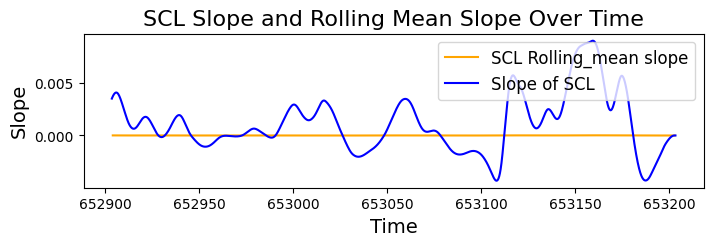

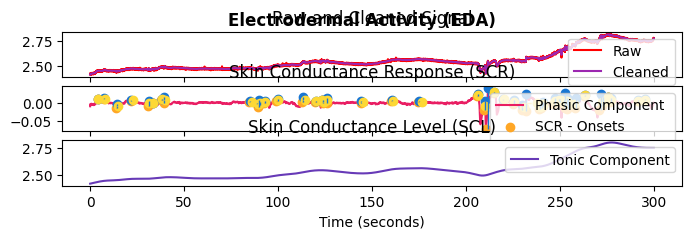

In [ ]:
[eda_vars, eda_plt1, eda_plt2] = eda_qc(xdf_filename)

In [ ]:
eda_vars.keys()

dict_keys(['sampling_rate', 'signal_integrity_check', 'average_scl', 'scl_sd', 'scl_cv', 'average_scr_amplitude', 'sc_validity', 'snr'])

In [ ]:
eda_print = {
    "Effective sampling rate": f'{eda_vars["sampling_rate"]:.4f}', 
    "Signal to noise ratio": f'{eda_vars["snr"]:.4f}',
    "Signal integrity check": f'{eda_vars["signal_integrity_check"]:.4f}',
    "Average skin conductance level": f'{eda_vars["average_scl"]:.4f}',
    "Skin conductance level std": f'{eda_vars["scl_sd"]:.4f}',
    "Skin conductance level coefficient of variation": f'{eda_vars["scl_cv"]:.4f}',
    "Average amplitude of skin conductance response": f'{eda_vars["average_scr_amplitude"]:.4f}',
    "Skin conductance response validity": f'{eda_vars["sc_validity"]:.4f}' # this will need to be changed to [scr_validity]
}

## 4. RSP

Effective sampling rate: 599.8626
Signal to Noise Ratio: 8.8478
Breath amplitude mean: 0.4837
Breath amplitude std: 0.3395
Breath amplitude range: 0.0895 - 2.9062
Respiration rate mean: 19.5429
Respiration rate std: 2.7556
Respiration rate range: 8.4004 - 27.4104
Peak to peak interval mean: 3.2281
Peak to peak interval std: 1.5669
Peak to peak interval range: 0.4784 - 18.2047
Baseline drift: 0.0826
Autocorrelation at typical breath cycle: 0.1166


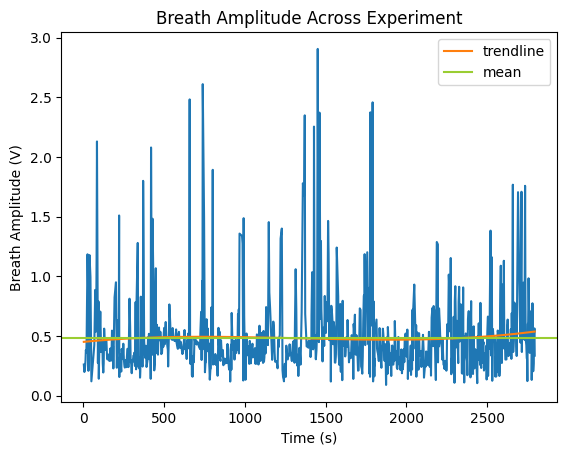

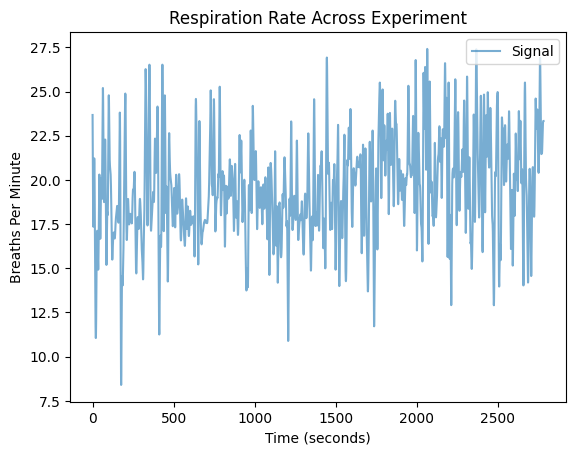

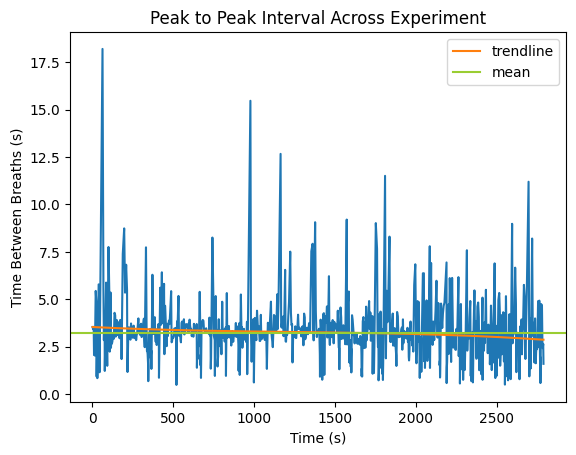

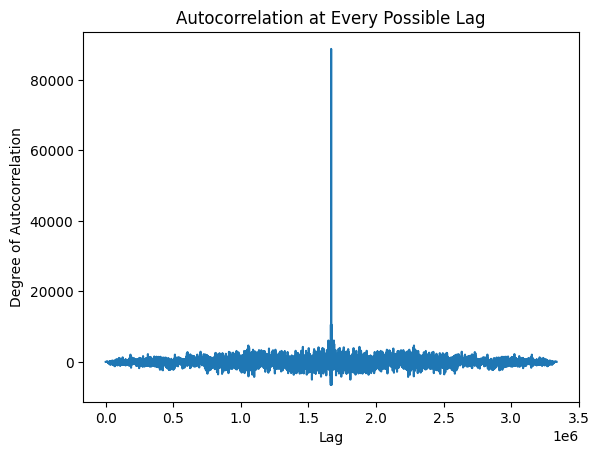

In [ ]:
rsp_vars = rsp_qc(xdf_filename)

In [ ]:
rsp_print = {
    "Effective sampling rate": f'{rsp_vars["sampling_rate"]:.4f}', 
    "Signal to noise ratio": f'{rsp_vars["rsp_snr"]:.4f}',
    "Breath amplitude mean": f'{rsp_vars["breath_amplitude_mean"]:.4f}',
    "Breath amplitude std": f'{rsp_vars["breath_amplitude_std"]:.4f}',
    "Breath amplitude range": f'{rsp_vars["breath_amplitude_range"]}',
    "Respiration rate mean": f'{rsp_vars["rsp_rate_mean"]:.4f}',
    "Respiration rate std": f'{rsp_vars["rsp_rate_std"]:.4f}', 
    "Respiration rate range": f'{rsp_vars["rsp_rate_range"]}', 
    "Peak to peak interval mean": f'{rsp_vars["ptp_mean"]:.4f}', 
    "Peak to peak interval std": f'{rsp_vars["ptp_std"]:.4f}', 
    "Peak to peak interval range": f'{rsp_vars["ptp_range"]}', 
    "Baseline drift": f'{rsp_vars["baseline_drift"]:.4f}', 
    "Autocorrelation at typical breath cycle": f'{rsp_vars["autocorrelation"]:.4f}'
}

In [ ]:
rsp_print

{'Effective sampling rate': '599.8626',
 'Signal to noise ratio': '8.8478',
 'Breath amplitude mean': '0.4837',
 'Breath amplitude std': '0.3395',
 'Breath amplitude range': '0.0895 - 2.9062',
 'Respiration rate mean': '19.5429',
 'Respiration rate std': '2.7556',
 'Respiration rate range': '8.4004 - 27.4104',
 'Peak to peak interval mean': '3.2281',
 'Peak to peak interval std': '1.5669',
 'Peak to peak interval range': '0.4784 - 18.2047',
 'Baseline drift': '0.0826',
 'Autocorrelation at typical breath cycle': '0.1166'}

## 5. Mic

Effective sampling rate: 44099.1164
Difference between .wav file and lsl timestamps durations: 0.0460
number of NaN's: 0 
percent of NaN's: 0.0000%
mic samples first quartile: -36.0 
mic samples third quartile: 35.0
mic samples standard deviation: 146.1546
mic samples min: -4109 
mic samples max: 4623


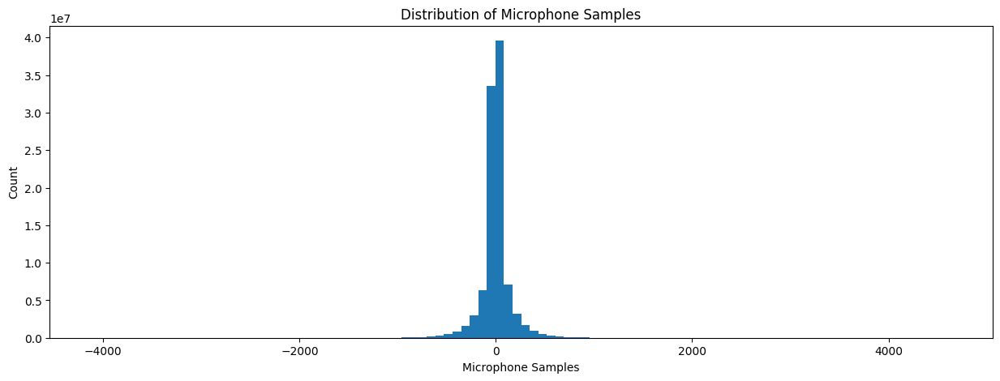

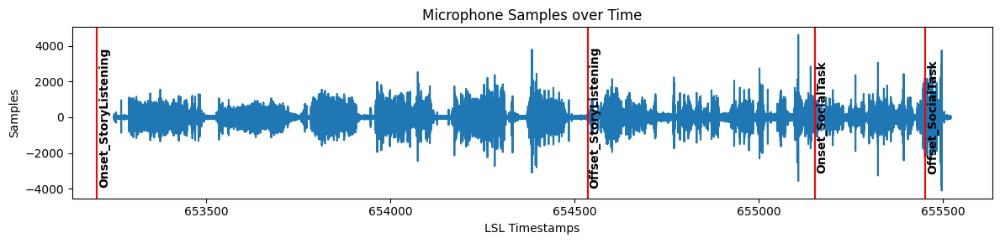

In [ ]:
mic_vars = mic_qc(xdf_filename)

In [ ]:
mic_print = {
    "Effective sampling rate": f'{mic_vars["sampling_rate"]:.4f}', 
    "Difference between .wav file and lsl timestamps durations": f'{mic_vars["lsl_wav_duration_diff"]:.4f}', 
    "Number of NaN's": f'{mic_vars["num_NaN"]:.4f}',
    "Percent of NaN's": f'{mic_vars["percent_NaN"]:.4f}',
    "Mic samples first quartile": f'{mic_vars["quan25"]:.4f}',
    "Mic samples third quartile": f'{mic_vars["quan75"]:.4f}',
    "Mic samples std": f'{mic_vars["std"]:.4f}',
    "Mic samples min": f'{mic_vars["min"]:.4f}',
    "Mic samples max": f'{mic_vars["max"]:.4f}'
}

## 6. Webcam

RestingState duration matches camera duration!
RestingState:  300.0007746036863
Webcam Stream:  299.97281997906975


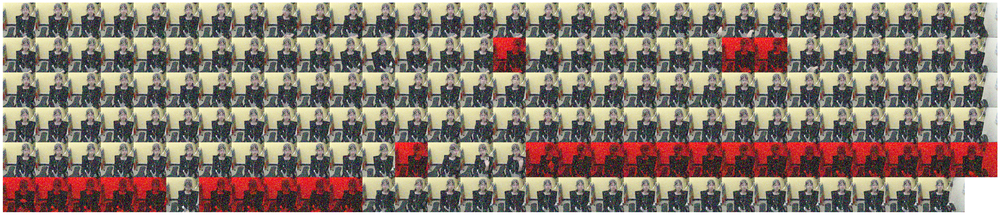

In [ ]:
webcam_vars = webcam_qc(xdf_filename=xdf_filename,
                video_file=video_filename, task='RestingState')

In [ ]:
webcam_vars

{'collected_full_RestingState': True,
 'sampling_rate': np.float64(30.03626427629033),
 'face_perc': 0.8487208008898777}

In [ ]:
webcam_print = {
    "Effective sampling rate": f'{webcam_vars["sampling_rate"]:.4f}', 
    "Difference between .wav file and lsl timestamps durations": webcam_vars["collected_full_RestingState"], 
    "Number of NaN's": f'{webcam_vars["face_perc"]:.4f}'
}

In [ ]:
webcam_print

{'Effective sampling rate': '30.0363',
 'Difference between .wav file and lsl timestamps durations': True,
 "Number of NaN's": '0.8487'}

## 7. ET

Effective sampling rate: 119.9958
Flag: all coordinates have the same % validity within each measure (LR, gaze point/origin/diameter): True
Flag: % of NaNs is the same between coordinate systems (UCS and TBCS (gaze origin) and between UCS and display area (gaze point)): True
Mean difference in percent valid data between right and left eyes: 3.0449%
Percent of data with gaze point differences of over 0.2 mm: 6.9252%


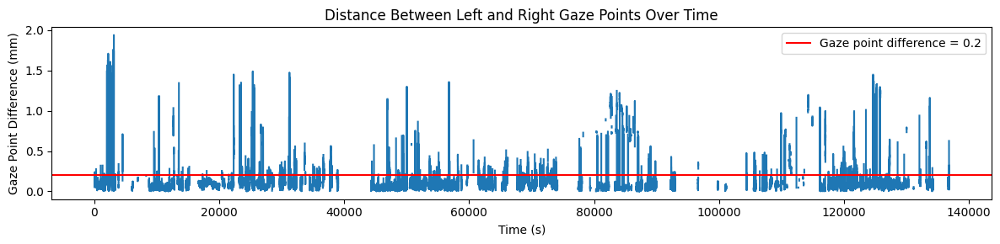

In [ ]:
et_vars = et_qc(xdf_filename)

In [ ]:
et_print = {
    "Effective sampling rate": f'{et_vars["sampling_rate"]:.4f}', 
    "Flag: all coordinates have the same % validity within each measure (LR, gaze point/origin/diameter)": et_vars["flag1"], 
    "Flag: % of NaNs is the same between coordinate systems (UCS and TBCS (gaze origin) and between UCS and display area (gaze point)):": et_vars["flag2"],
    "Mean difference in percent valid data between right and left eyes": f'{et_vars["LR_mean_diff"]:.4f}',
    "Percent of data with gaze point differences of over 0.2 mm": f'{et_vars["percent_over02"]:.4f}'
}

## Stream Durations 

### functions are in utils.py (but should be called in the report)

In [ ]:
duration_vars = {"Durations of each modality + comparison to expected duration:": get_durations(ExperimentPart='Experiment', xdf_path=xdf_filename)}

et is shorter than expected for Experiment by 1557.8496 seconds
mic is shorter than expected for Experiment by 371.9715 seconds

Experiment DataFrame


In [ ]:
duration_print = duration_vars

In [ ]:
# i wont run these but they are here for reference
# get_durations('RestingState', xdf_filename)
# get_durations('CampFriend', xdf_filename)
# get_durations('SocialTask', xdf_filename)
# whole_durations(xdf_filename)

## LSL Problem

    subject modality  num_losses percent_lost
1  P5182010       et           1     58.6961%
3  P5182010      cam           1      2.1742%
0  P5182010       ps           1      0.4784%
    subject modality  num_losses percent_lost
1  P5182010       et           1     58.6744%
0  P5182010       ps           1      0.5052%


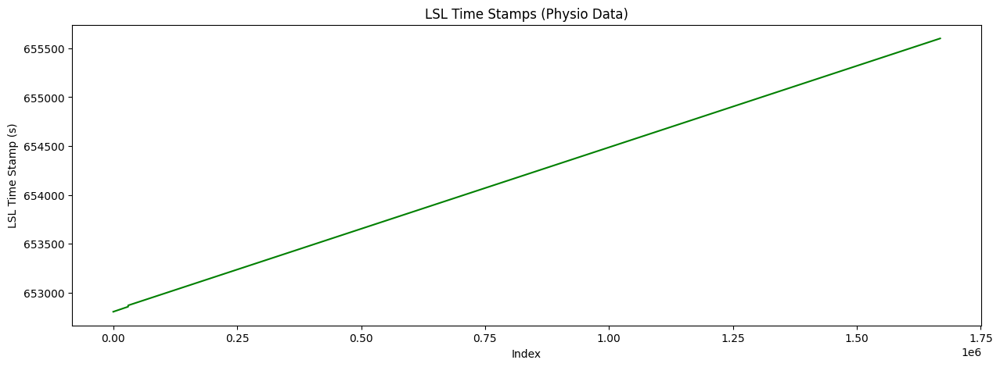

In [ ]:
lsl_vars = lsl_problem_qc(xdf_filename)

In [ ]:
lsl_vars

{'percent_loss':     subject modality  num_losses percent_lost
 1  P5182010       et           1     58.6961%
 3  P5182010      cam           1      2.1742%
 0  P5182010       ps           1      0.4784%,
 'loss_before_social_task':     subject modality  num_losses percent_lost
 1  P5182010       et           1     58.6744%
 0  P5182010       ps           1      0.5052%}

In [ ]:
lsl_print = {
    "Percent of missing data in entire experiment": lsl_vars["percent_loss"],
    "Percent of missing data before social task offset": lsl_vars["loss_before_social_task"]
}

# I try from scratch

In [ ]:
# Modalities and corresponding data
metric_names = ["ECG", "EDA", "RSP", "MIC", "ET", "WEBCAM", "Stream Durations", "LSL"]
metrics_list = [ecg_vars, eda_vars, rsp_vars, mic_vars, et_vars, webcam_vars, duration_vars, lsl_vars]

# PDF structure
pdf_path = "output_report.pdf"
doc = SimpleDocTemplate(pdf_path, pagesize=A4)
elements = []
styles = getSampleStyleSheet()

# Define subtitle style if not already done
subtitle_style = ParagraphStyle(
    name="Subtitle",
    parent=styles["Heading2"],
    fontSize=14,
    leading=16,
    textColor="gray",
    spaceAfter=12,
    alignment=1  # Centered
)


elements.append(Paragraph(f"Subject Report: {subject}", styles["Title"]))
elements.append(Paragraph(f"Collection Date: {get_collection_date(xdf_filename)}", subtitle_style))
elements.append(Spacer(1, 12))

# Format each metrics dict
for name, metrics in zip(metric_names, metrics_list):
    elements.append(Paragraph(name, styles["Heading2"]))
    for k, v in metrics.items():
        if isinstance(v, pd.DataFrame):
            data = [v.columns.tolist()] + v.values.tolist()  # Include headers
            table = Table(data, repeatRows=1)
            table.hAlign = 'LEFT'

            table.setStyle(TableStyle([
                ('BACKGROUND', (0, 0), (-1, 0), colors.lightgrey),
                ('GRID', (0, 0), (-1, -1), 0.5, colors.black),
                ('FONTNAME', (0, 0), (-1, -1), 'Helvetica'),
                ('FONTSIZE', (0, 0), (-1, -1), 10),
                ('ALIGN', (0, 0), (-1, -1), 'LEFT'),
            ]))
            elements.append(Paragraph(k, styles['Normal']))
            elements.append(Spacer(1, 12))

            elements.append(table)
            elements.append(Spacer(1, 12))
        else:
            text = f"<b>{k}:</b> {v:.4f}" if isinstance(v, float) else f"<b>{k}:</b> {v}"
            elements.append(Paragraph(text, styles["Normal"]))
    elements.append(Spacer(1, 12))

    # images
    folder = "report_images"
    image_keyword = name.lower()
    if os.path.exists(folder):
        for fname in sorted(os.listdir(folder)):
            if image_keyword in fname.lower() and subject in fname:
                image_path = os.path.join(folder, fname)
                img = Image(image_path, width=400, height=200)  # Adjust size as needed
                elements.append(img)


doc.build(elements)
print(f'PDF created: {pdf_path}')

PDF created: output_report.pdf


In [ ]:
from IPython.display import FileLink

FileLink("output_report.pdf")

/Users/camilla.strauss/Desktop/MOBI_QC/src/MOBI_QC/output_report.pdf

# Second Report with formatting

In [ ]:
# Modalities and corresponding data
metric_names = ["ECG", "EDA"]#, "RSP"]#, "MIC", "ET", "WEBCAM", "Stream Durations", "LSL"]
metrics_list = [ecg_print, eda_print]#, rsp_print]#, mic_print, et_print, webcam_print, duration_print, lsl_print]

# metric_names = ["ECG"]
# metrics_list = [ecg_print]

# PDF structure
pdf_path = "output_report_formatted.pdf"
doc = SimpleDocTemplate(pdf_path, pagesize=A4)
elements = []
styles = getSampleStyleSheet()

# Define subtitle style if not already done
subtitle_style = ParagraphStyle(
    name="Subtitle",
    parent=styles["Heading2"],
    fontSize=14,
    leading=16,
    textColor="gray",
    spaceAfter=12,
    alignment=1  # Centered
)

# page number function
def add_page_number(canvas, doc):
    page_num = f'{canvas.getPageNumber()}'
    canvas.setFont("Helvetica", 9)
    canvas.drawRightString(570, 20, page_num)  # (x, y) from bottom-left


elements.append(Paragraph(f"Subject Report: {subject}", styles["Title"]))
elements.append(Paragraph(f"Collection Date: {get_collection_date(xdf_filename)}", subtitle_style))
elements.append(Spacer(1, 12))

# Format each metrics dict
for name, metrics in zip(metric_names, metrics_list):
    elements.append(Paragraph(name, styles["Heading2"]))
    for k, v in metrics.items():
        if isinstance(v, pd.DataFrame):
            data = [v.columns.tolist()] + v.values.tolist()  # Include headers
            table = Table(data, repeatRows=1)
            table.hAlign = 'LEFT'

            table.setStyle(TableStyle([
                ('BACKGROUND', (0, 0), (-1, 0), colors.lightgrey),
                ('GRID', (0, 0), (-1, -1), 0.5, colors.black),
                ('FONTNAME', (0, 0), (-1, -1), 'Helvetica'),
                ('FONTSIZE', (0, 0), (-1, -1), 10),
                ('ALIGN', (0, 0), (-1, -1), 'LEFT'),
            ]))
            elements.append(Paragraph(k, styles['Normal']))
            elements.append(Spacer(1, 12))

            elements.append(table)
            elements.append(Spacer(1, 12))
        else:
            text = f"<b>{k}:</b> {v:.4f}" if isinstance(v, float) else f"<b>{k}:</b> {v}"
            elements.append(Paragraph(text, styles["Normal"]))
    elements.append(Spacer(1, 12))

    # images
    folder = "report_images"
    image_keyword = name.lower()
    if os.path.exists(folder):
        for fname in sorted(os.listdir(folder)):
            if image_keyword in fname.lower() and subject in fname:
                image_path = os.path.join(folder, fname)

                # get dimensions
                image_reader = ImageReader(image_path)
                orig_width, orig_height = image_reader.getSize()
                print(orig_width, orig_height)

                img = Image(image_path, width=orig_width, height=orig_height)  # Adjust size as needed
                elements.append(img)


doc.build(elements, onFirstPage = add_page_number, onLaterPages = add_page_number)
print(f'PDF created: {pdf_path}')

600 200
800 200
713 246
PDF created: output_report_formatted.pdf


In [ ]:
from IPython.display import FileLink

FileLink("output_report_formatted.pdf")

/Users/camilla.strauss/Desktop/MOBI_QC/src/MOBI_QC/output_report_formatted.pdf

In [ ]:
for name, metrics in zip(metric_names, metrics_list):
    print(name)
    image_keyword = name.lower()

    if os.path.exists(folder):
        for fname in sorted(os.listdir(folder)):
            if image_keyword in fname.lower() and subject in fname:
                image_path = os.path.join(folder, fname)

                # get dimensions
                image_reader = ImageReader(image_path)
                orig_width, orig_height = image_reader.getSize()
                print(fname, orig_width, orig_height)

ECG
P5182010_ecg_report.png 1500 500
EDA
P5182010_eda_report.png 800 200
P5182010_eda_slope.png 2142 743


# Report

## 1. Set up Document

In [ ]:


# Set up the document
doc = SimpleDocTemplate("example_report.pdf", pagesize=LETTER)
styles = getSampleStyleSheet()
story = []

# Add a title
title = Paragraph(f"Subject Report: {subject}", styles["Title"])
story.append(title)
story.append(Spacer(1, 20))

# Add a paragraph
text = f"""
Collection Date: {get_collection_date(xdf_filename)} 
"""
paragraph = Paragraph(text, styles["BodyText"])
story.append(paragraph)
story.append(Spacer(1, 20))




NameError: name 'LETTER' is not defined

In [ ]:
# Add a subtitle
subtitle = Paragraph(f"EEG", styles["Heading2"], )
story.append(subtitle)
story.append(Spacer(1, 5))

# Add a paragraph
text = f"""
Data preprocessed by performing <b>line noise removal</b>, <b>robust referencing</b>, and <b>bad channel detection/interpolation</b> using PyPrep pipeline. First, the pipeline applies a notch filter at 60 Hz and its harmonics to remove power line noise. Then, it performs <b>robust average referencing</b>, where it detects bad channels, interpolates them using surrounding signals, and computes a median-based reference across EEG channels. This ensures a stable reference even in the presence of noisy electrodes. The final output is a cleaned EEG dataset with a consistent reference, ready for further analysis.
"""

paragraph = Paragraph(text, styles["BodyText"], )
story.append(paragraph)
story.append(Spacer(1, 20))

## Computer the EEG variables (will take time)

In [ ]:
# add an image
from reportlab.lib.units import inch
from reportlab.platypus import Image
image = Image("/Users/camilla.strauss/Desktop/MOBI_QC/src/MOBI_QC/report_images/P5287460_rsp_peaktopeak.png", 7*inch, 3*inch)
image.hAlign = 'CENTER'
story.append(image)

In [ ]:
story.append(Spacer(1, 20))

In [ ]:



# Define the table style to make all borders white
style = TableStyle([
    ('GRID', (0,0), (-1,-1), 1, colors.white),  # All grid lines white
    ('BOX', (0,0), (-1,-1), 1, colors.white),   # Outer box white
    ('INNERGRID', (0,0), (-1,-1), 1, colors.white)  # Inner grid white
])
# Create the table
# table = Table(data, style=style)
# Apply style
#table.setStyle(style)
# story.append(table)
#story.append(Spacer(1, 20))

NameError: name 'data' is not defined

In [ ]:
# Build the PDF
doc.build(story)

In [ ]:
table